In [ ]:
#Importing all required library
import nltk
import re
import string
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Downloading nltk StopWords and Wordnet
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
from nltk.corpus import stopwords
stop_words=stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

# Dataset1
1.importing 1st dataset
2.EDA on 1st dataset
3.Data pre-processing

In [ ]:
Dataset1 = pd.read_csv("/content/drive/MyDrive/Model idk22222/Data_set/news/news.csv")

In [ ]:
Dataset1.head()

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [ ]:
Dataset1.tail()

,Unnamed: 0,title,text,label
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL
6334,4330,Jeb Bush Is Suddenly Attacking Trump. Here's W...,Jeb Bush Is Suddenly Attacking Trump. Here's W...,REAL


In [ ]:
Dataset1.shape

(6335, 4)

In [ ]:
Dataset1.nunique()

Unnamed: 0    6335
title         6256
text          6060
label            2
dtype: int64

In [ ]:
Dataset1["Article"] = Dataset1["title"] + Dataset1["text"]
Dataset1.sample(frac = 1) #Shuffle 100%

Dataset1.label[Dataset1.label == 'REAL'] = 1
Dataset1.label[Dataset1.label == 'FAKE'] = 0

Dataset1 = Dataset1.loc[:,['Article','label']]
Dataset1 = Dataset1.dropna()

<ipython-input-11-586347da7020>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Dataset1.label[Dataset1.label == 'REAL'] = 1
<ipython-input-11-586347da7020>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Dataset1.label[Dataset1.label == 'FAKE'] = 0


In this step we will clean the data that will be used for training. The cleaning will involve these steps-
1.Removing all the extra information like brackets, any kind of puctuations - commas, apostrophes, quotes, question marks, and more.
2.Remove all the numeric text, urls

In [ ]:
def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)

    return text

In [ ]:
##  Applying the wordpre method to the dataset
Dataset1['Article']=Dataset1['Article'].apply(wordpre)

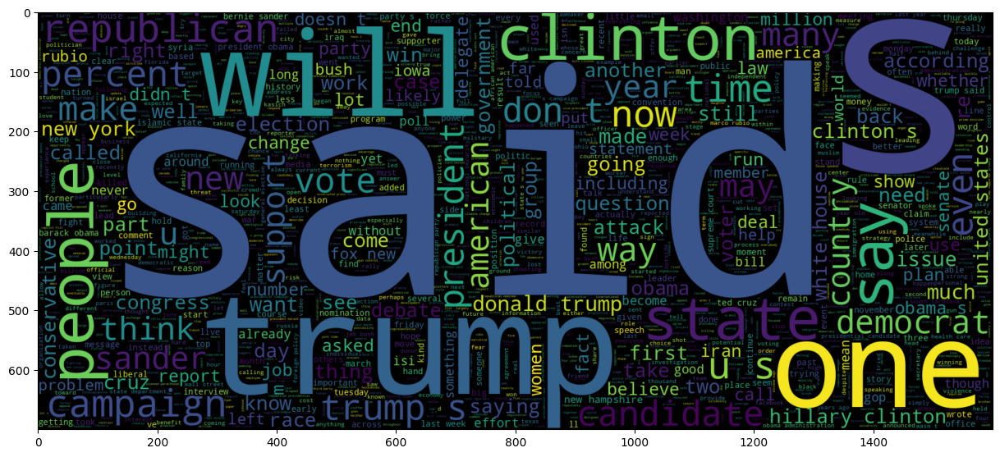

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

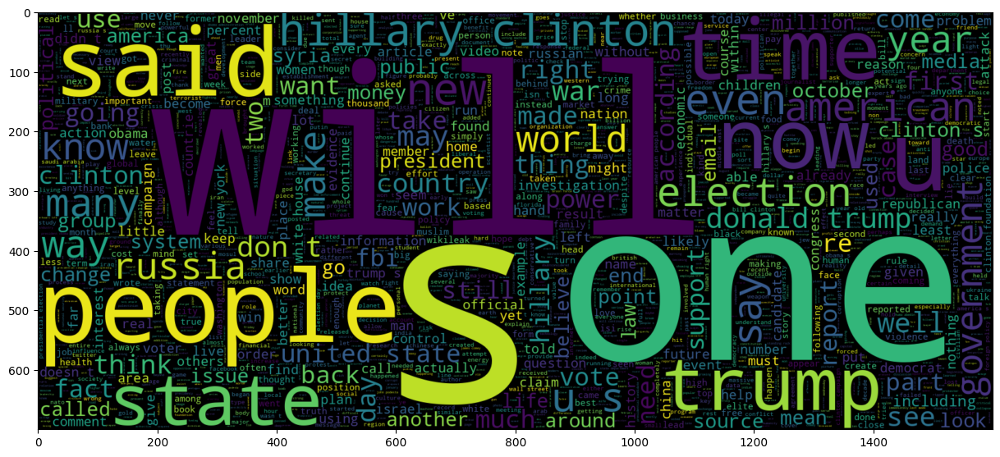

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset2

In [ ]:
Dataset2_true = pd.read_csv("/content/drive/MyDrive/Model idk22222/Dataset/True.csv")
Dataset2_fake = pd.read_csv("/content/drive/MyDrive/Model idk22222/Dataset/Fake.csv")

In [ ]:
Dataset2_true.nunique()

title      20826
text       21192
subject        2
date         716
dtype: int64

In [ ]:
Dataset2_fake.nunique()

title      17903
text       17455
subject        6
date        1681
dtype: int64

In [ ]:
#Counting by Subjects in Real news
for key,count in Dataset2_true.subject.value_counts().items():
    print(f"{key}:\t{count}")

#Getting Total Rows
print(f"Total Records:\t{Dataset2_true.shape[0]}")

politicsNews:	11272
worldnews:	10145
Total Records:	21417


In [ ]:
#Counting by Subjects in Fake news
for key,count in Dataset2_fake.subject.value_counts().items():
    print(f"{key}:\t{count}")

#Getting Total Rows
print(f"Total Records:\t{Dataset2_fake.shape[0]}")

News:	9050
politics:	6841
left-news:	4459
Government News:	1570
US_News:	783
Middle-east:	778
Total Records:	23481


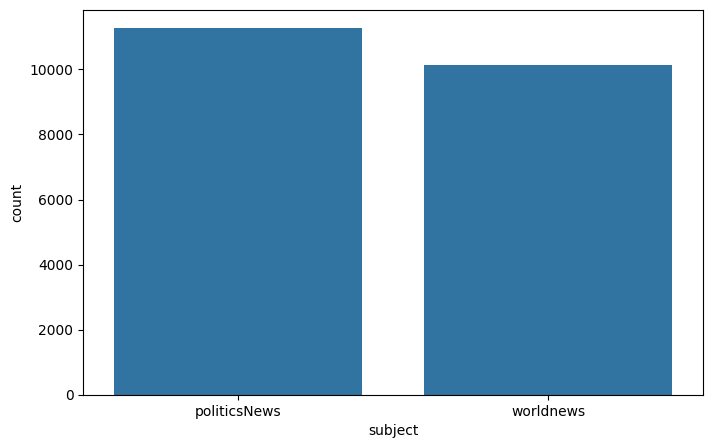

In [ ]:
#ploting the Subjects in Real news
plt.figure(figsize=(8,5))
sns.countplot(x="subject", data=Dataset2_true)
plt.show()

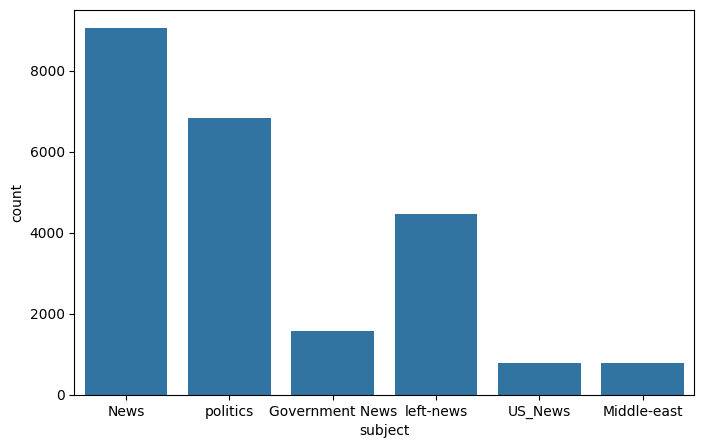

In [ ]:
#ploting the Subjects in Fake news
plt.figure(figsize=(8,5))
sns.countplot(x="subject", data=Dataset2_fake)
plt.show()

In [ ]:
Dataset2_true['label']= 1
Dataset2_fake['label']= 0
Dataset2 = pd.concat([Dataset2_true, Dataset2_fake])
Dataset2["Article"] = Dataset2["title"] + Dataset2["text"]
Dataset2.sample(frac = 1) #Shuffle 100%
Dataset2 = Dataset2.loc[:,['Article','label']]

In [ ]:
Dataset2

,Article,label
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1
...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,0
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
23479,How to Blow $700 Million: Al Jazeera America F...,0


In [ ]:
##  Applying the wordpre method to the dataset
Dataset2['Article']=Dataset2['Article'].apply(wordpre)

In [ ]:
Dataset2.head()

,Article,label
0,as u s budget fight looms republicans flip t...,1
1,u s military to accept transgender recruits o...,1
2,senior u s republican senator let mr muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much mor...,1


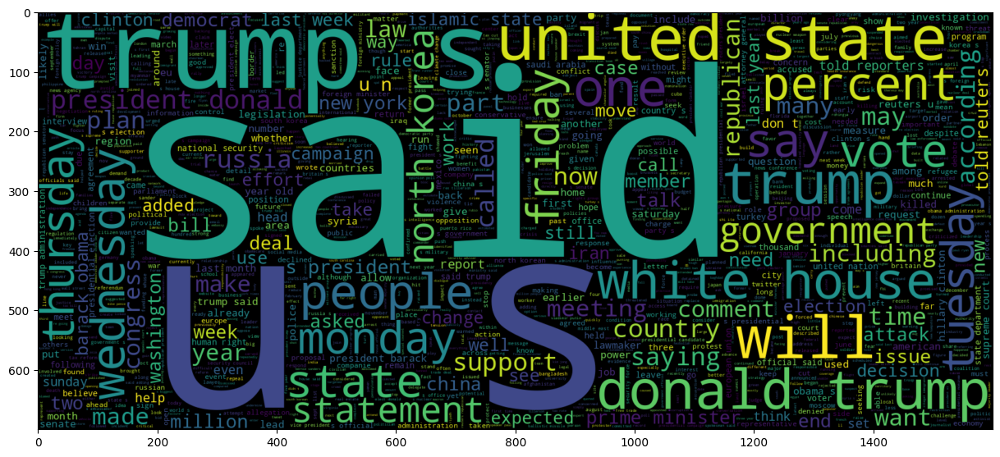

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

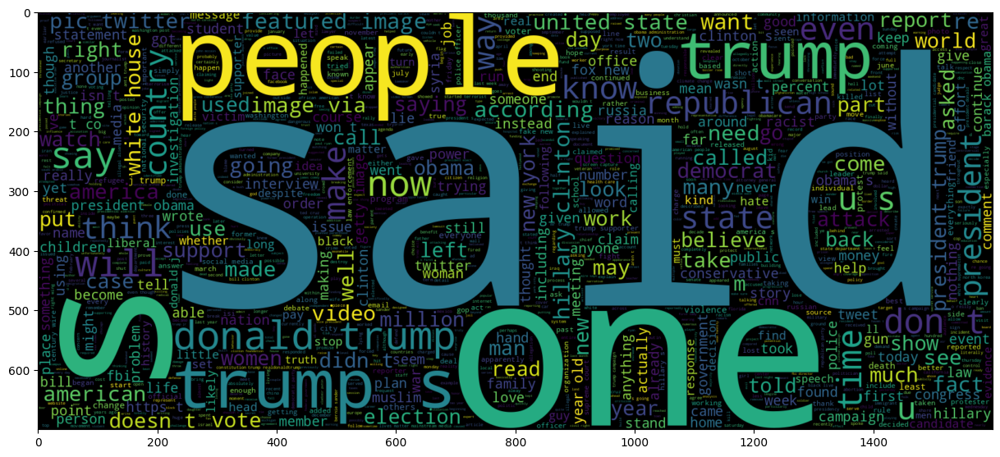

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 3

In [ ]:
Dataset3_real = pd.read_csv("/content/drive/MyDrive/Model idk22222/politifact/politifact_real.csv")
Dataset3_fake = pd.read_csv("/content/drive/MyDrive/Model idk22222/politifact/politifact_fake.csv")

In [ ]:
Dataset3_real['label']= 1
Dataset3_fake['label']= 0
Dataset3 = pd.concat([Dataset3_real, Dataset3_fake])
Dataset3["Article"] = Dataset3["title"]
Dataset3.sample(frac = 1) #Shuffle 100%
Dataset3 = Dataset3.loc[:,['Article','label']]

In [ ]:
Dataset3

,Article,label
0,National Federation of Independent Business,1
1,comments in Fayetteville NC,1
2,"Romney makes pitch, hoping to close deal : Ele...",1
3,Democratic Leaders Say House Democrats Are Uni...,1
4,"Budget of the United States Government, FY 2008",1
...,...,...
427,Who is affected by the government shutdown?,0
428,Lindsey Graham Threatens To Convert To Democra...,0
429,ELECTORAL COLLEGE ELECTOR COMMITS SUICIDE TO A...,0
430,Sarah Palin Calls To Boycott Mall Of America B...,0


In [ ]:
##  Applying the wordpre method to the dataset
Dataset3['Article']=Dataset3['Article'].apply(wordpre)

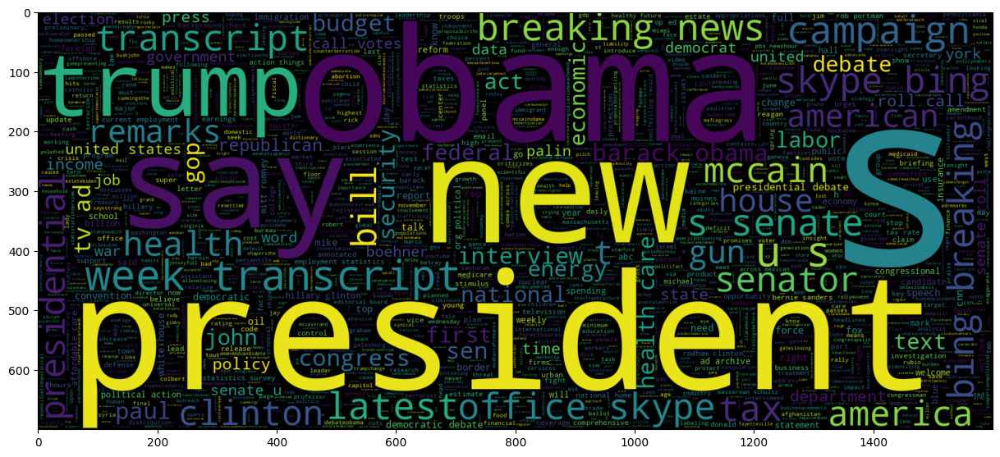

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

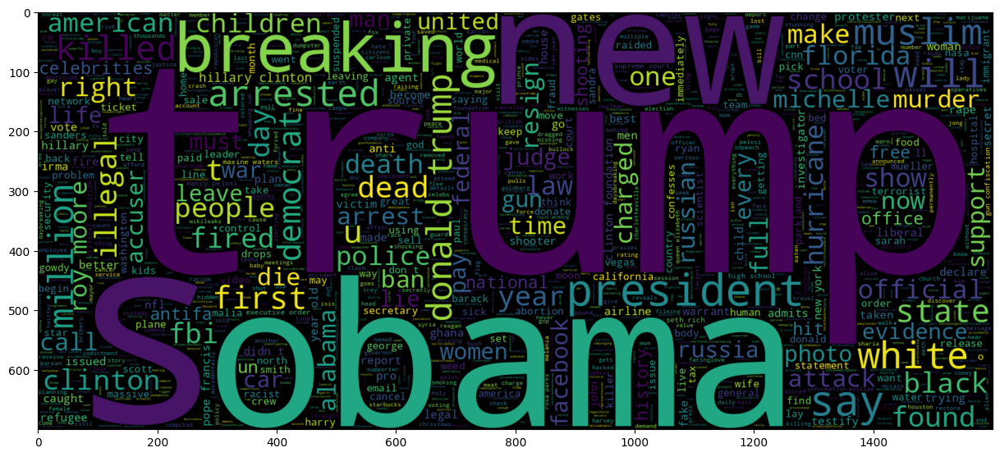

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 4

In [ ]:
Dataset4 = pd.read_csv("/content/drive/MyDrive/Model idk22222/Data-set/train.csv")

In [ ]:
Dataset4.shape

(20800, 5)

In [ ]:
Dataset4.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [ ]:
Dataset4["Article"] = Dataset4["title"] + Dataset4["text"]
Dataset4.sample(frac = 1) #Shuffle 100%

Dataset4 = Dataset4.loc[:,['Article','label']]
Dataset4 = Dataset4.dropna()

In [ ]:
##  Applying the wordpre method to the dataset
Dataset4['Article']=Dataset4['Article'].apply(wordpre)

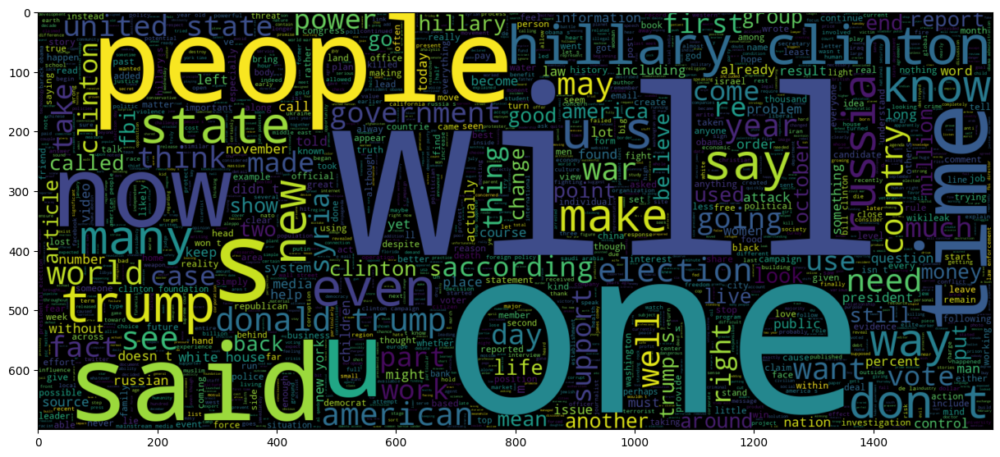

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

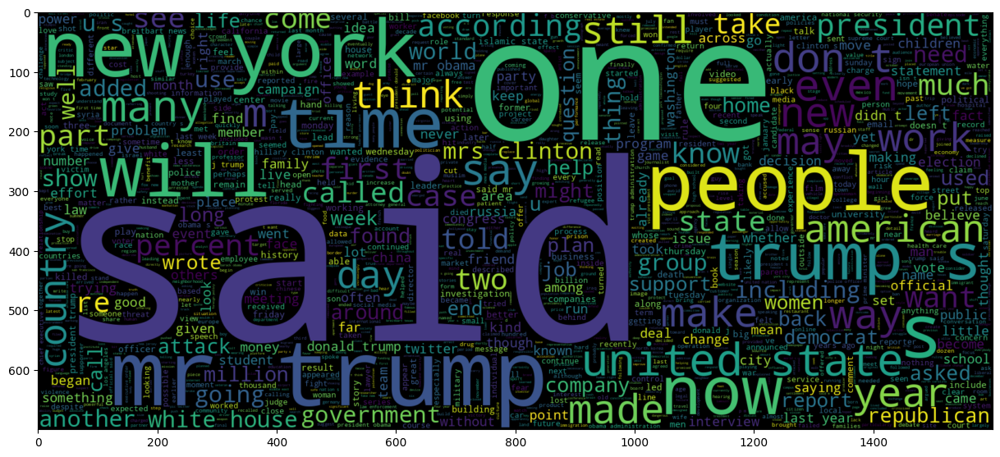

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 5

In [ ]:
Dataset5 = pd.read_csv("/content/drive/MyDrive/Model idk22222/data.csv")

In [ ]:
Dataset5.shape

(4009, 4)

In [ ]:
Dataset5

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\nOn Sunday mornin...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1
...,...,...,...,...
4004,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch\n% of readers think this story...,0
4005,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,0
4006,https://www.activistpost.com/2017/09/ron-paul-...,"Ron Paul on Trump, Anarchism & the AltRight",NaN,0
4007,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) - China said it plans to ac...,1


In [ ]:
Dataset5["Article"] = Dataset5["Headline"] + Dataset5["Body"]
Dataset5["label"] = Dataset5["Label"]
Dataset5.sample(frac = 1) #Shuffle 100%
Dataset5 = Dataset5.loc[:,['Article','label']]
Dataset5 = Dataset5.dropna()

In [ ]:
##  Applying the wordpre method to the dataset
Dataset5['Article']=Dataset5['Article'].apply(wordpre)

In [ ]:
Dataset5

,Article,label
0,four ways bob corker skewered donald trumpimag...,1
1,linklater s war veteran comedy speaks to moder...,1
2,trump s fight with corker jeopardizes his legi...,1
3,egypt s cheiron wins tie up with pemex for mex...,1
4,jason aldean opens snl with vegas tributecou...,1
...,...,...
4003,cnn and globalist exposed steve quayle and a...,0
4004,trends to watchtrends to watch of readers th...,0
4005,trump jr is soon to give a minute speech for...,0
4007,china to accept overseas trial data in bid to ...,1


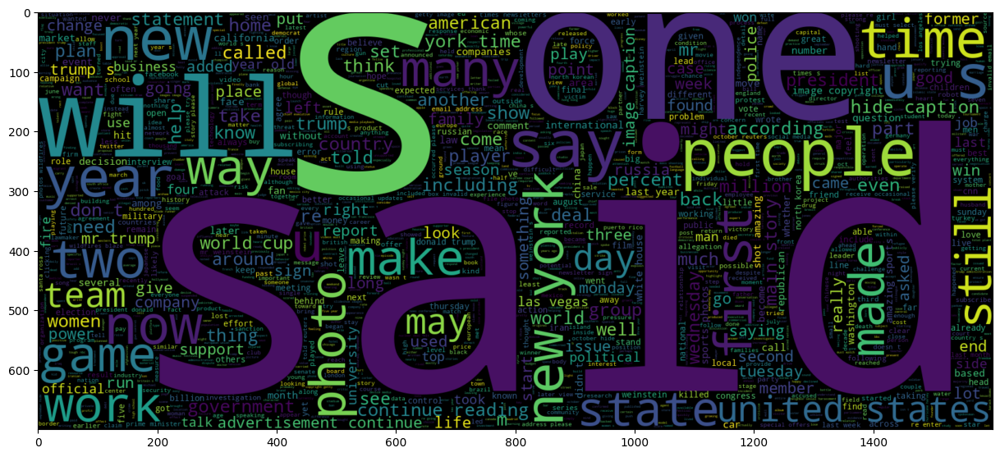

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

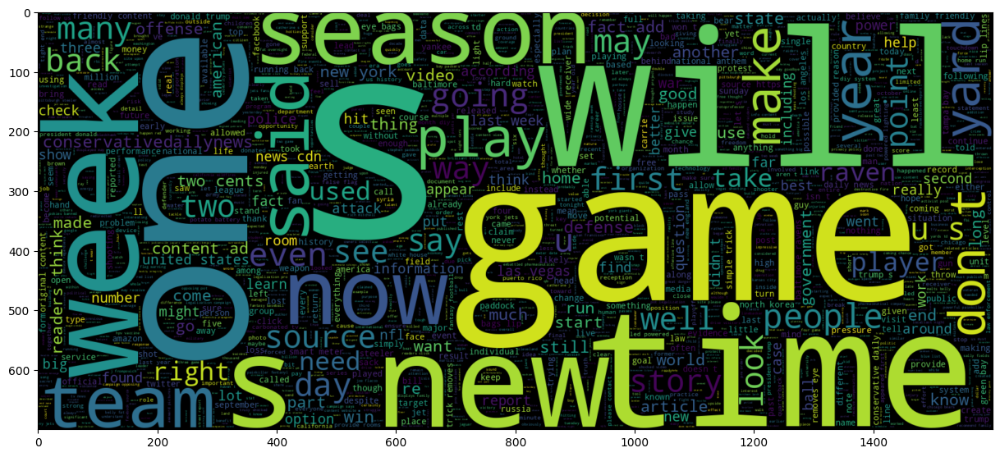

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 6

In [ ]:
Dataset6 = pd.read_csv("/content/drive/MyDrive/data/WELFake_Dataset.csv")

In [ ]:
Dataset6

,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1
...,...,...,...,...
72129,72129,Russians steal research on Trump in hack of U....,WASHINGTON (Reuters) - Hackers believed to be ...,0
72130,72130,WATCH: Giuliani Demands That Democrats Apolog...,"You know, because in fantasyland Republicans n...",1
72131,72131,Migrants Refuse To Leave Train At Refugee Camp...,Migrants Refuse To Leave Train At Refugee Camp...,0
72132,72132,Trump tussle gives unpopular Mexican leader mu...,MEXICO CITY (Reuters) - Donald Trump’s combati...,0


In [ ]:
Dataset6["Article"] = Dataset6["title"] + Dataset6["text"]
Dataset6["label"] = Dataset6["label"]
Dataset6.sample(frac = 1) #Shuffle 100%
Dataset6 = Dataset6.loc[:,['Article','label']]
Dataset6 = Dataset6.dropna()

In [ ]:
Dataset6

,Article,label
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,1
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,1
3,"Bobby Jindal, raised Hindu, uses story of Chri...",0
4,SATAN 2: Russia unvelis an image of its terrif...,1
5,About Time! Christian Group Sues Amazon and SP...,1
...,...,...
72129,Russians steal research on Trump in hack of U....,0
72130,WATCH: Giuliani Demands That Democrats Apolog...,1
72131,Migrants Refuse To Leave Train At Refugee Camp...,0
72132,Trump tussle gives unpopular Mexican leader mu...,0


In [ ]:
Dataset7 = pd.read_csv("/content/drive/MyDrive/data/english_test_with_labels.csv")

In [ ]:
Dataset7

,id,tweet,label
0,1,Our daily update is published. States reported...,real
1,2,Alfalfa is the only cure for COVID-19.,fake
2,3,President Trump Asked What He Would Do If He W...,fake
3,4,States reported 630 deaths. We are still seein...,real
4,5,This is the sixth time a global health emergen...,real
...,...,...,...
2135,2136,#CoronaVirusUpdates: State-wise details of Tot...,real
2136,2137,Tonight 12(midnight) onwards Disaster Manageme...,fake
2137,2138,296 new cases of #COVID19Nigeria; Plateau-85 E...,real
2138,2139,RT @CDCemergency: #DYK? @CDCgov’s One-Stop Sho...,real


In [ ]:
Dataset8 = pd.read_csv("/content/Constraint_English_Train.xlsx - Sheet1.csv")

In [ ]:
Dataset8

,id,tweet,label
0,1,The CDC currently reports 99031 deaths. In gen...,real
1,2,States reported 1121 deaths a small rise from ...,real
2,3,Politically Correct Woman (Almost) Uses Pandem...,fake
3,4,#IndiaFightsCorona: We have 1524 #COVID testin...,real
4,5,Populous states can generate large case counts...,real
...,...,...,...
6415,6416,A tiger tested positive for COVID-19 please st...,fake
6416,6417,???Autopsies prove that COVID-19 is??� a blood...,fake
6417,6418,_A post claims a COVID-19 vaccine has already ...,fake
6418,6419,Aamir Khan Donate 250 Cr. In PM Relief Cares Fund,fake


In [ ]:
Dataset8 = pd.read_csv("/content/Constraint_English_Train.xlsx - Sheet1.csv")

In [ ]:
Dataset9 = pd.read_csv("/content/Constraint_English_Val.xlsx - Sheet1.csv")

In [ ]:
Dataset9

,id,tweet,label
0,1,Chinese converting to Islam after realising th...,fake
1,2,11 out of 13 people (from the Diamond Princess...,fake
2,3,"COVID-19 Is Caused By A Bacterium, Not Virus A...",fake
3,4,Mike Pence in RNC speech praises Donald Trump’...,fake
4,5,6/10 Sky's @EdConwaySky explains the latest #C...,real
...,...,...,...
2135,2136,Donald Trump wrongly claimed that New Zealand ...,fake
2136,2137,Current understanding is #COVID19 spreads most...,real
2137,2138,Nothing screams “I am sat around doing fuck al...,fake
2138,2139,Birx says COVID-19 outbreak not under control ...,fake


In [ ]:
#combining all the datset into one
frames = [Dataset7, Dataset8, Dataset9]
DatasetNEW = pd.concat(frames)

In [ ]:
DatasetNEW

,id,tweet,label
0,1,Our daily update is published. States reported...,real
1,2,Alfalfa is the only cure for COVID-19.,fake
2,3,President Trump Asked What He Would Do If He W...,fake
3,4,States reported 630 deaths. We are still seein...,real
4,5,This is the sixth time a global health emergen...,real
...,...,...,...
2135,2136,Donald Trump wrongly claimed that New Zealand ...,fake
2136,2137,Current understanding is #COVID19 spreads most...,real
2137,2138,Nothing screams “I am sat around doing fuck al...,fake
2138,2139,Birx says COVID-19 outbreak not under control ...,fake


In [ ]:
DatasetNEW["text"] = DatasetNEW["Article"]
DatasetNEW.sample(frac = 1) #Shuffle 100%
DatasetNEW.label[DatasetNEW.label == 'real'] = 1
DatasetNEW.label[DatasetNEW.label == 'fake'] = 0

DatasetNEW = DatasetNEW.loc[:,['text','label']]
DatasetNEW = DatasetNEW.dropna()

In [ ]:
DatasetNEW

,text,label
0,Our daily update is published. States reported...,1
1,Alfalfa is the only cure for COVID-19.,0
2,President Trump Asked What He Would Do If He W...,0
3,States reported 630 deaths. We are still seein...,1
4,This is the sixth time a global health emergen...,1
...,...,...
2135,Donald Trump wrongly claimed that New Zealand ...,0
2136,Current understanding is #COVID19 spreads most...,1
2137,Nothing screams “I am sat around doing fuck al...,0
2138,Birx says COVID-19 outbreak not under control ...,0


In [ ]:
def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)

    return text

In [ ]:
##  Applying the wordpre method to the dataset
DatasetNEW['text']=DatasetNEW['text'].apply(wordpre)

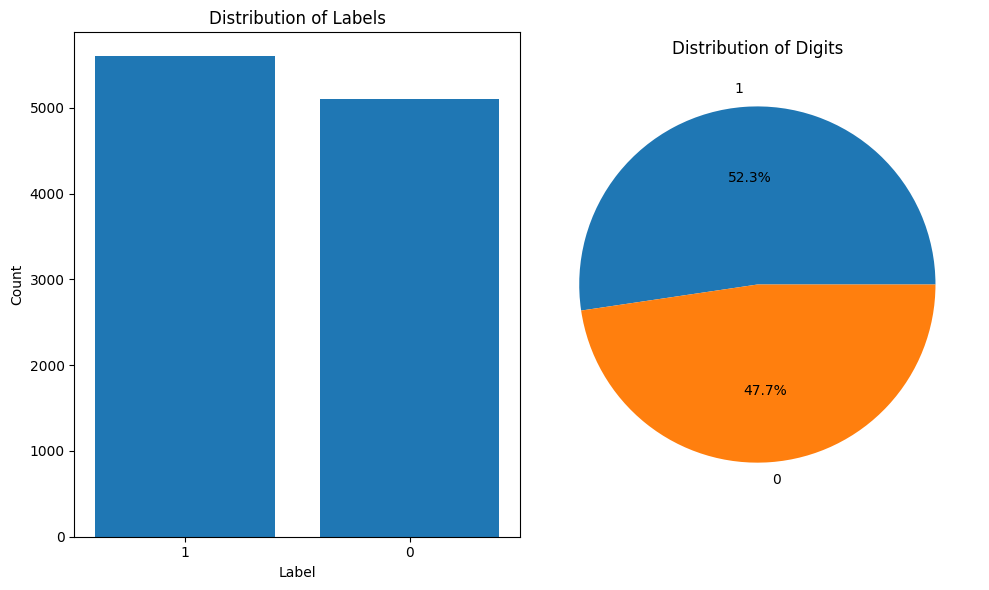

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the occurrences of each label in the 'label' column
label_counts = DatasetNEW['label'].value_counts()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))

axes[0].bar(label_counts.index.astype(str), label_counts.values)
axes[0].set_title('Distribution of Labels')
axes[0].set_xlabel('Label')
axes[0].set_ylabel('Count')

axes[1].pie(label_counts, labels=label_counts.index, autopct='%1.1f%%')
axes[1].set_title('Distribution of Digits')

plt.tight_layout()
plt.show()

In [ ]:
#combining all the datset into one
frames = [Dataset1, Dataset2, Dataset3, Dataset4,Dataset5 ,Dataset6]
Dataset = pd.concat(frames)

In [ ]:
import nltk
nltk.download('punkt')  # NLTK tokenizer data

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
Dataset

,Article,label
0,you can smell hillary s feardaniel greenfield ...,0
1,watch the exact moment paul ryan committed pol...,0
2,kerry to go to paris in gesture of sympathyu s...,1
3,bernie supporters on twitter erupt in anger ag...,0
4,the battle of new york why this primary matte...,1
...,...,...
72129,Russians steal research on Trump in hack of U....,0
72130,WATCH: Giuliani Demands That Democrats Apolog...,1
72131,Migrants Refuse To Leave Train At Refugee Camp...,0
72132,Trump tussle gives unpopular Mexican leader mu...,0


In [ ]:
Dataset.to_csv(r"preprocessing_finaldata.csv",index=False)

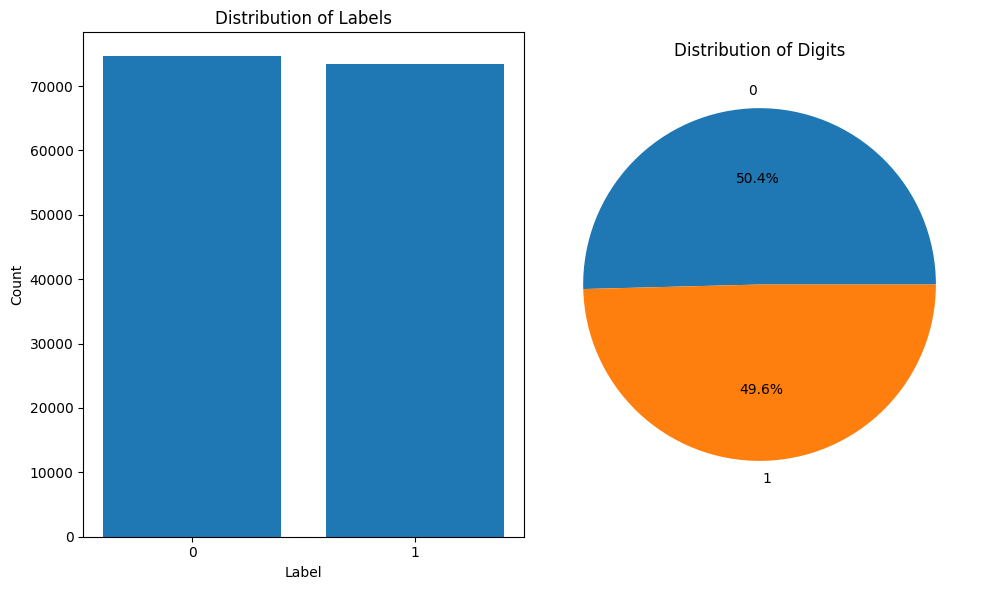

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the occurrences of each label in the 'label' column
label_counts = Dataset['label'].value_counts()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))

axes[0].bar(label_counts.index.astype(str), label_counts.values)
axes[0].set_title('Distribution of Labels')
axes[0].set_xlabel('Label')
axes[0].set_ylabel('Count')

axes[1].pie(label_counts, labels=label_counts.index, autopct='%1.1f%%')
axes[1].set_title('Distribution of Digits')

plt.tight_layout()
plt.show()

In [ ]:
import chardet

with open('/content/train.csv', 'rb') as f:
    result = chardet.detect(f.read())
print(result)

{'encoding': 'Windows-1252', 'confidence': 0.7296069725052893, 'language': ''}


In [ ]:
with open('/content/test.csv', 'rb') as f:
    result = chardet.detect(f.read())
print(result)

{'encoding': 'Windows-1252', 'confidence': 0.7296690307328605, 'language': ''}


In [ ]:
encoding = result['encoding']
DataA2 = pd.read_csv('/content/train.csv', encoding=encoding)

In [ ]:
ncoding = result['encoding']
DataA = pd.read_csv('/content/test.csv', encoding=encoding)

In [ ]:
DataA

,textID,text,sentiment,Time of Tweet,Age of User,Country,Population -2020,Land Area (Km²),Density (P/Km²)
0,f87dea47db,Last session of the day http://twitpic.com/67ezh,neutral,morning,0-20,Afghanistan,38928346.0,652860.0,60.0
1,96d74cb729,Shanghai is also really exciting (precisely -...,positive,noon,21-30,Albania,2877797.0,27400.0,105.0
2,eee518ae67,"Recession hit Veronique Branquinho, she has to...",negative,night,31-45,Algeria,43851044.0,2381740.0,18.0
3,01082688c6,happy bday!,positive,morning,46-60,Andorra,77265.0,470.0,164.0
4,33987a8ee5,http://twitpic.com/4w75p - I like it!!,positive,noon,60-70,Angola,32866272.0,1246700.0,26.0
...,...,...,...,...,...,...,...,...,...
4810,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4811,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#combining all the datset into one
frames = [DataA, DataA2]
SEN = pd.concat(frames)

In [ ]:
SEN

,textID,text,sentiment,Time of Tweet,Age of User,Country,Population -2020,Land Area (Km²),Density (P/Km²),selected_text
0,f87dea47db,Last session of the day http://twitpic.com/67ezh,neutral,morning,0-20,Afghanistan,38928346.0,652860.0,60.0,NaN
1,96d74cb729,Shanghai is also really exciting (precisely -...,positive,noon,21-30,Albania,2877797.0,27400.0,105.0,NaN
2,eee518ae67,"Recession hit Veronique Branquinho, she has to...",negative,night,31-45,Algeria,43851044.0,2381740.0,18.0,NaN
3,01082688c6,happy bday!,positive,morning,46-60,Andorra,77265.0,470.0,164.0,NaN
4,33987a8ee5,http://twitpic.com/4w75p - I like it!!,positive,noon,60-70,Angola,32866272.0,1246700.0,26.0,NaN
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,negative,night,31-45,Ghana,31072940.0,227540.0,137.0,d lost
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,negative,morning,46-60,Greece,10423054.0,128900.0,81.0,", don`t force"
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,positive,noon,60-70,Grenada,112523.0,340.0,331.0,Yay good for both of you.
27479,ed167662a5,But it was worth it ****.,positive,night,70-100,Guatemala,17915568.0,107160.0,167.0,But it was worth it ****.


In [ ]:
DataA

,textID,text,selected_text,sentiment,Time of Tweet,Age of User,Country,Population -2020,Land Area (Km²),Density (P/Km²)
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,morning,0-20,Afghanistan,38928346,652860.0,60
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,noon,21-30,Albania,2877797,27400.0,105
2,088c60f138,my boss is bullying me...,bullying me,negative,night,31-45,Algeria,43851044,2381740.0,18
3,9642c003ef,what interview! leave me alone,leave me alone,negative,morning,46-60,Andorra,77265,470.0,164
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,noon,60-70,Angola,32866272,1246700.0,26
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,night,31-45,Ghana,31072940,227540.0,137
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,morning,46-60,Greece,10423054,128900.0,81
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,noon,60-70,Grenada,112523,340.0,331
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,night,70-100,Guatemala,17915568,107160.0,167


In [ ]:
# Check for missing values
print(SEN.isnull().sum())

textID              1281
text                1282
sentiment           1281
Time of Tweet       1281
Age of User         1281
Country             1281
Population -2020    1281
Land Area (Km²)     1281
Density (P/Km²)     1281
selected_text       4816
dtype: int64


In [ ]:
# Drop rows with any null values
SEN.dropna(inplace=True)

In [ ]:
# Verify the data after dropping null values
print("Data shape after dropping null values:", SEN.shape)
print(SEN.head())

Data shape after dropping null values: (27480, 10)
       textID                                               text sentiment  \
0  cb774db0d1                I`d have responded, if I were going   neutral   
1  549e992a42      Sooo SAD I will miss you here in San Diego!!!  negative   
2  088c60f138                          my boss is bullying me...  negative   
3  9642c003ef                     what interview! leave me alone  negative   
4  358bd9e861   Sons of ****, why couldn`t they put them on t...  negative   

  Time of Tweet Age of User      Country  Population -2020  Land Area (Km²)  \
0       morning        0-20  Afghanistan        38928346.0         652860.0   
1          noon       21-30      Albania         2877797.0          27400.0   
2         night       31-45      Algeria        43851044.0        2381740.0   
3       morning       46-60      Andorra           77265.0            470.0   
4          noon       60-70       Angola        32866272.0        1246700.0   

   De

In [ ]:
# Check for missing values
print(SEN.isnull().sum())

textID              0
text                0
sentiment           0
Time of Tweet       0
Age of User         0
Country             0
Population -2020    0
Land Area (Km²)     0
Density (P/Km²)     0
selected_text       0
dtype: int64


In [ ]:
SEN

,textID,text,sentiment,Time of Tweet,Age of User,Country,Population -2020,Land Area (Km²),Density (P/Km²),selected_text
0,cb774db0d1,"I`d have responded, if I were going",neutral,morning,0-20,Afghanistan,38928346.0,652860.0,60.0,"I`d have responded, if I were going"
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,negative,noon,21-30,Albania,2877797.0,27400.0,105.0,Sooo SAD
2,088c60f138,my boss is bullying me...,negative,night,31-45,Algeria,43851044.0,2381740.0,18.0,bullying me
3,9642c003ef,what interview! leave me alone,negative,morning,46-60,Andorra,77265.0,470.0,164.0,leave me alone
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...",negative,noon,60-70,Angola,32866272.0,1246700.0,26.0,"Sons of ****,"
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,negative,night,31-45,Ghana,31072940.0,227540.0,137.0,d lost
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,negative,morning,46-60,Greece,10423054.0,128900.0,81.0,", don`t force"
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,positive,noon,60-70,Grenada,112523.0,340.0,331.0,Yay good for both of you.
27479,ed167662a5,But it was worth it ****.,positive,night,70-100,Guatemala,17915568.0,107160.0,167.0,But it was worth it ****.


In [ ]:
newsSEN = pd.read_csv("/content/fake_news_merged_final.csv")

In [ ]:
newsSEN.head()

,ID,label,statement,subject,speaker,speaker_job,state_info,party_affiliation,barely_true_counts,false_counts,...,fear,joy,disgust,sad,speaker_id,list,sentiment_code,full_text,emotion,digit
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,...,0.008926,0.026096,0.263479,0.531887,_0_,"[0, 1]",_NEG_,abortion says the annies list political group ...,"[0.121137,0.263479,0.008926,0.026096,0.531887,...",0
1,10540.json,True,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,...,0.124566,0.191357,0.016999,0.102045,_1_,"[0, 1]",_NEG_,energy history job accomplishments when did th...,"[0.095352,0.016999,0.124566,0.191357,0.102045,...",1
2,324.json,True,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,...,0.024162,0.500384,0.454228,0.052453,_2_,"[1, 0]",_NEG_,foreign policy hillary clinton agrees with joh...,"[0.039559,0.454228,0.024162,0.500384,0.052453,...",1
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,...,0.194674,0.375055,0.022509,0.383403,_3_,"[0, 1]",_NEG_,NaN,"[0.004804,0.022509,0.194674,0.375055,0.383403,...",0
4,9028.json,True,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,...,0.215996,0.222402,0.045672,0.274343,_4_,"[0, 1]",NaN,NaN,"[0.044237,0.045672,0.215996,0.222402,0.274343,...",1


In [ ]:
newsSEN["Text"] = newsSEN["statement"] + newsSEN["full_text"]
newsSEN["Sentiment"] = newsSEN["sentiment"]
newsSEN.sample(frac = 1) #Shuffle 100%
newsSEN = newsSEN.loc[:,['Text','Sentiment']]
newsSEN = newsSEN.dropna()

In [ ]:
newsSEN

,Text,Sentiment
0,Says the Annies List political group supports ...,NEGATIVE
1,When did the decline of coal start? It started...,NEGATIVE
2,"Hillary Clinton agrees with John McCain ""by vo...",NEGATIVE
5,The Chicago Bears have had more starting quart...,NEGATIVE
7,I'm the only person on this stage who has work...,NEGATIVE
...,...,...
12778,Says U.S. Rep. Charles Bass wants to privatize...,NEGATIVE
12780,"In the past two years, Democrats have spent mo...",NEGATIVE
12781,"For the first time in more than a decade, impo...",NEGATIVE
12782,Says Donald Trump has bankrupted his companies...,NEGATIVE


In [ ]:
newsSEN.to_csv(r"NewsSEN.csv",index=False)

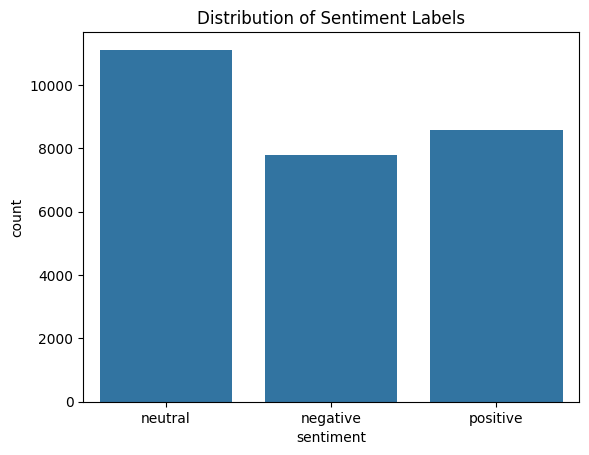

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of sentiment labels
sns.countplot(x='sentiment', data=DataA)
plt.title('Distribution of Sentiment Labels')
plt.show()

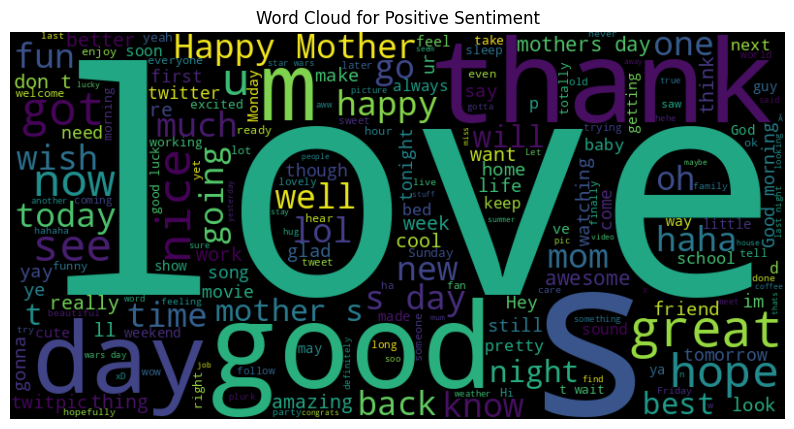

In [ ]:
from wordcloud import WordCloud

# Generate a word cloud for positive sentiment
positive_text = ' '.join(DataA[DataA['sentiment'] == 'positive']['text'])
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(positive_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')
plt.show()



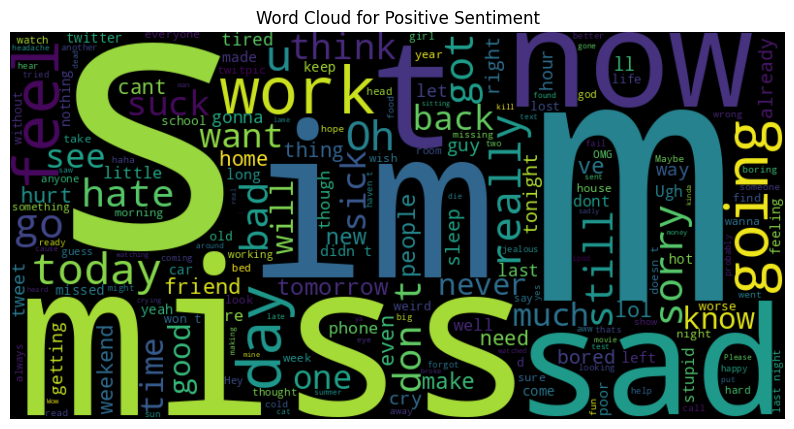

In [ ]:
# Generate a word cloud for positive sentiment
positive_text = ' '.join(DataA[DataA['sentiment'] == 'negative']['text'])
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(positive_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Positive Sentiment')
plt.axis('off')
plt.show()

In [ ]:
SEN.to_csv("Sentiment_DATA.csv",index=False)

In [ ]:
Dataset10_NEWS = pd.read_csv("/content/drive/MyDrive/Copy of preprocessing.csv")
Dataset10_GAZA = pd.read_csv("/content/Fakenewssheet - Sheet1 (1).csv")

In [ ]:
Dataset10_NEWS

,label,full_text,digit
0,False,abortion says annies list political group supp...,0
1,True,energy history job accomplishments decline coa...,1
2,True,foreign policy hillary clinton agrees john mcc...,1
3,True,education chicago bears starting quarterbacks ...,1
4,True,ethics m person stage worked actively just las...,1
...,...,...,...
54032,True,brussels reuters nato allies tuesday welcomed ...,1
54033,True,london reuters lexisnexis provider legal regul...,1
54034,True,minsk reuters shadow disused sovietera factori...,1
54035,True,moscow reuters vatican secretary state cardina...,1


In [ ]:
# Drop a column
Dataset10_NEWS = Dataset10_NEWS.drop(columns=['label'])

In [ ]:
Dataset10_GAZA

,Number,Title,Text,Label
0,1,Bridging Voices: Solidarity Across Borders,An American student who was detained because o...,1.0
1,2,Egypt's Warning,High-level Source: Egypt Renews its Warning to...,1.0
2,3,Egypt's Mission to the United Nations,The General Assembly Adopts a Historic Resolut...,1.0
3,4,advocating for Peace: UN General Assembly Pres...,President of the United Nations General Assemb...,0.0
4,5,Ukrainian Nazis' did riot at the World Cup in ...,NaN,0.0
...,...,...,...,...
75,76,Israeli airstrike that killed dozens in Rafah ...,Footage filmed by Palestinian journalist Alamu...,1.0
76,77,"Deal reached to extend Israel-Hamas truce, Isr...",A temporary truce between Israel and Hamas has...,1.0
77,78,US wants Israel to move civilians out of south...,Biden administration officials are discussing ...,1.0
78,79,Israeli leaders ratchet up war rhetoric as tru...,Israeli government and military leaders ratche...,1.0


In [ ]:
Dataset10_GAZA.columns

Index(['Number', 'Title', 'Text ', 'Label '], dtype='object')

In [ ]:
Dataset10_NEWS.columns

Index(['full_text', 'digit'], dtype='object')

In [ ]:
# Rename the column to 'label'
Dataset10_GAZA = Dataset10_GAZA.rename(columns={'Label ': 'label'})

In [ ]:
Dataset10_NEWS
# Rename the column to 'label'
Dataset10_NEWS = Dataset10_NEWS.rename(columns={'digit': 'label'})

In [ ]:
label = 'label'
# Fill NaN values with 0
Dataset10_GAZA[label] = Dataset10_GAZA[label].fillna(0)

In [ ]:
# Convert the column values from float to int
# Replace 'column_name' with the actual name of your column
Dataset10_GAZA['label'] = Dataset10_GAZA['label'].astype(int)

In [ ]:
# Display the first few rows of the modified dataset
Dataset10_GAZA

,Number,Title,Text,label
0,1,Bridging Voices: Solidarity Across Borders,An American student who was detained because o...,1
1,2,Egypt's Warning,High-level Source: Egypt Renews its Warning to...,1
2,3,Egypt's Mission to the United Nations,The General Assembly Adopts a Historic Resolut...,1
3,4,advocating for Peace: UN General Assembly Pres...,President of the United Nations General Assemb...,0
4,5,Ukrainian Nazis' did riot at the World Cup in ...,NaN,0
...,...,...,...,...
75,76,Israeli airstrike that killed dozens in Rafah ...,Footage filmed by Palestinian journalist Alamu...,1
76,77,"Deal reached to extend Israel-Hamas truce, Isr...",A temporary truce between Israel and Hamas has...,1
77,78,US wants Israel to move civilians out of south...,Biden administration officials are discussing ...,1
78,79,Israeli leaders ratchet up war rhetoric as tru...,Israeli government and military leaders ratche...,1


In [ ]:
Dataset10_GAZA["text"] = Dataset10_GAZA["Title"] + Dataset10_GAZA["Text "]

In [ ]:
Dataset10_NEWS["text"] = Dataset10_NEWS["full_text"]

In [ ]:
Dataset10_NEWS.sample(frac = 1) #Shuffle 100%
Dataset10_NEWS = Dataset10_NEWS.loc[:,['text','label']]

In [ ]:
Dataset10_GAZA.sample(frac = 1) #Shuffle 100%
Dataset10_GAZA = Dataset10_GAZA.loc[:,['text','label']]

In [ ]:
Dataset10_GAZA

,text,label
0,Bridging Voices: Solidarity Across BordersAn A...,1
1,Egypt's WarningHigh-level Source: Egypt Renews...,1
2,Egypt's Mission to the United NationsThe Gener...,1
3,advocating for Peace: UN General Assembly Pres...,0
4,NaN,0
...,...,...
75,Israeli airstrike that killed dozens in Rafah ...,1
76,"Deal reached to extend Israel-Hamas truce, Isr...",1
77,US wants Israel to move civilians out of south...,1
78,Israeli leaders ratchet up war rhetoric as tru...,1


In [ ]:
Dataset10_NEWS

,text,label
0,abortion says annies list political group supp...,0
1,energy history job accomplishments decline coa...,1
2,foreign policy hillary clinton agrees john mcc...,1
3,education chicago bears starting quarterbacks ...,1
4,ethics m person stage worked actively just las...,1
...,...,...
54032,brussels reuters nato allies tuesday welcomed ...,1
54033,london reuters lexisnexis provider legal regul...,1
54034,minsk reuters shadow disused sovietera factori...,1
54035,moscow reuters vatican secretary state cardina...,1


In [ ]:
#combining all the datset into one
frames = [Dataset10_NEWS, Dataset10_GAZA]
news_gaza = pd.concat(frames)

In [ ]:
news_gaza

,text,label
0,abortion says annies list political group supp...,0
1,energy history job accomplishments decline coa...,1
2,foreign policy hillary clinton agrees john mcc...,1
3,education chicago bears starting quarterbacks ...,1
4,ethics m person stage worked actively just las...,1
...,...,...
75,Israeli airstrike that killed dozens in Rafah ...,1
76,"Deal reached to extend Israel-Hamas truce, Isr...",1
77,US wants Israel to move civilians out of south...,1
78,Israeli leaders ratchet up war rhetoric as tru...,1


In [ ]:
news_gaza.sample(frac = 1) #Shuffle 100%

,text,label
37230,washington reuters four democrats senate banki...,1
5080,children crime education welfare weve got 40 y...,1
19998,brent bozell political commentary fox news jus...,0
27644,april 3 2017 brooklynborn sarsour daughter pal...,0
12673,donald trump s inaugural address received poor...,0
...,...,...
47065,beijing reuters china s military sunday launch...,1
10224,hurricane harvey devastated texas 12th anniver...,0
36350,washington reuters justice department’s decisi...,1
51008,washingtonhavana reuters trump administration ...,1


In [ ]:
news_gaza

,text,label
0,abortion says annies list political group supp...,0
1,energy history job accomplishments decline coa...,1
2,foreign policy hillary clinton agrees john mcc...,1
3,education chicago bears starting quarterbacks ...,1
4,ethics m person stage worked actively just las...,1
...,...,...
75,Israeli airstrike that killed dozens in Rafah ...,1
76,"Deal reached to extend Israel-Hamas truce, Isr...",1
77,US wants Israel to move civilians out of south...,1
78,Israeli leaders ratchet up war rhetoric as tru...,1


In [ ]:
# Save the modified dataset to a new CSV file
news_gaza.to_csv('Gaza + News.csv', index=False)